# MTH3302 : Méthodes probabilistes et statistiques pour l'I.A.

Jonathan Jalbert<br/>
Professeur agrégé au Département de mathématiques et de génie industriel<br/>
Polytechnique Montréal<br/>


---
# Projet A2023 : Prédiction du nombre de passages sur le REV 


L’analyse des données ouvertes de la circulation sur la rue Saint-Denis révèle une hausse importante de l’utilisation du vélo par rapport aux autres véhicules, au tournant de l’installation du Réseau express vélo (REV) en 2020 comme le rapporte le journal *Le Devoir* dans cet [article](https://www.ledevoir.com/environnement/735849/le-ratio-velo-auto-s-ameliore-sur-le-rev-saint-denis). Serez-vous en mesure de prédire l'achalandage du REV pour l'année 2023, de janvier à septembre ? Est-ce que les conditions météorologiques ont une influence sur le nombre de passages ? Ce sont des questions que vous aurez l'occasion d'étudier dans le cadre de ce projet.

**But** : Prédire le nombre de passages journalier sur le REV en direction nord à l'intersection de la rue St-Denis et de la Piste des Carrières pour tous les jours entre le 1er janvier 2023 et le 30 septembre 2023.

**Objectifs spécifiques non exhaustifs**
1. Effectuer une analyse exploratoire des données afin d'extraire qualitativement certains les potentiels liens entre les variables.
2. Élaborer plusieurs modèles prédictifs pour le nombre de passages journaliers sur le REV en fonction des différentes variables explicatives à disposition (nombre de passages sur d'autres tronçons, conditions météorologiques, etc.).
3. Sélectionner le meilleur modèle prédicitif à l'aide d'un critère choisi.
4. Exploiter le modèle choisi pour effectuer vos prédictions.

Ces étapes peuvent être recommencées autant de fois que nécessaire afin d'obtenir le meilleur modèle prédictif possible.

La description du projet est disponible à l'adresse suivante : https://www.kaggle.com/t/b2f3163a94434f0da9e532139744c49d

Ce calepin Jupyter de base permet de charger les données fournies. La dernière section détaille la génération du fichier des prédictions afin de le soumettre sur Kaggle dans le bon format.

### Données

Dans un premier temps, vous devrez récupérer les données sur Kaggle. Les fichiers disponibles sont les suivants :
- train.csv
- test.csv

**Déposez ces fichiers dans le répertoire de ce calepin.**

Le fichier *train.csv* contient les conditions météorologiques ainsi que le nombre de passages enregistrés sur le tronçon du REV à l'intersection St-Denis/Castelnau (45.53905N,-73.61687W). Voici la description des variables :

- Date : date
- MaxTemp : Température maximale (°C)
- MinTemp : Température minimale (°C)
- MeanTemp : Température moyenne (°C)
- TotalRain : Accumulation totale de pluie (mm)
- TotalSnow : Accumulation totale de neige (cm)
- TotalPrecip : Accumulation totale de précipitations (pluie + neige, mm)
- SnowGrnd : Couvert de neige au sol (cm)
- SpdGust : Vitesse maximale des rafales de vent (km/h)
- REV : Nombre de passages de vélo au compteur sur le REV en direction sud à l'intersection St-Denis/Castelnau 

Le fichier *test.csv* contient les conditions météorologiques pour l'année 2023 mais pas le nombre de passages sur le REV, la variable que vous devrez prédire. Le fichier contient aussi l'identifiant (:ID) pour les prédictions. La qualité de vos prédictions sera ensuite évaluée avec le [*Root Mean Squared Log Error*](https://www.kaggle.com/code/carlolepelaars/understanding-the-metric-rmsle) lorsque vous les téléverserez sur Kaggle. Vos prédictions seront comparées à celles des autres équipes de la classe.


### Consignes

- Vous devez constituer une équipe de 3 à 5 personnes.
- Au moins une solution doit être proposée sur Kaggle.
- Utilisez votre identifiant d'équipe pour téléverser vos prédictions sur Kaggle.
- Un seul calepin *.ipynb* par équipe doit être remis. Ce fichier devra documenter et illustrer la procédure qui vous a permis de produire vos meilleures prédictions. Ce fichier constitue le rapport final du projet.
- Le langage Julia doit être utilisé.
- Votre démarche doit être rigoureusement justifiée (consultez la grille de correction pour vous orienter).

### Quelques conseils

Votre calepin doit permettre à une personne à l'extérieur de l'équipe de comprendre votre démarche et de reproduire vos résultats. Par exemple, une bonne façon de faire consiste à expliquer dans une cellule de texte la tâche qui est accomplie dans la cellule de code suivante. 

Je vous encourage fortement à faire une analyse exploratoire des données pour développer une meilleure expertise sur le problème. C'est une étape qui est toujours négligée mais qui est essentielle. C'est avec l'analyse exploratoire que vous viendra des idées d'amélioration, comme par exemple créer de nouvelles variables explicatives.

Vous pouvez utiliser directement tout ce qui se trouve dans les notes de cours sans explication et toutes les librairies utilisées dans le cours (incluant mes fonctions).

Ce calepin contient un modèle très simple de prédiction : on n'utilise qu'une seule variable explicative. Ce sera votre travail d'améliorer ces prédictions avec la méthode et les variables de votre choix.

S'il y a des données manquantes, ce sera à vous de traiter ce problème. Vous devriez développer une méthode d'imputation (de remplacement) des données manquantes.

Attention aux données aberrantes. Elles peuvent faire dérailler tous le modèle prédictif si elle ne sont pas prises en compte.

Prenez la peine de documenter succinctement les essais infructueux. Ce n'est pas nécessaire de les expliquer en détails, mais c'est important de les mentionner dans la discussion avec une raison possible de leur échec. De cette façon, une personne qui reprendra votre travail dans le futur ne perdra pas de temps à réessayer une méthode infructueuse déjà testée.

Vous pouvez aussi indiquer dans votre rapport les raisons qui vous font croire pourquoi une méthode a moins bien performée de ce qui était attendu. Vous pouvez également mentionner ce que vous auriez pu tenter si vous aviez eu plus de temps ou plus de données. L'idée est de guider l'analyste qui prendrait la relève de votre travail.

Vous êtes limités à deux soumissionspar jour et par équipe sur Kaggle. Je vous suggère donc de bien tester vos modèles localement et de ne téléverser que vos meilleurs prédictions de la journée.

In [73]:
using CSV, DataFrames, Dates, Gadfly, GLM, Statistics

---
## 1. Chargement de données

In [74]:
train = CSV.read("./nombres-de-passages-sur-le-rev/train.csv", DataFrame)
first(train, 5)

Row,Date,MaxTemp,MinTemp,MeanTemp,TotalRain,TotalSnow,TotalPrecip,SnowGrnd,SpdGust,REV
,Date,Float64?,Float64?,Float64?,Float64,Float64,Float64,Int64?,Int64?,Int64
1,2021-10-23,8.2,1.6,4.9,0.0,0.0,0.0,missing,missing,168
2,2021-10-24,11.9,2.5,7.2,0.0,0.0,0.0,missing,missing,694
3,2021-10-25,7.8,3.0,5.4,1.2,0.0,1.2,missing,43,746
4,2021-10-26,11.3,7.2,9.3,7.2,0.0,7.2,missing,53,646
5,2021-10-27,12.6,6.1,9.4,0.0,0.0,0.0,missing,59,1250


---
## 2. Analyse exploratoire

Cette section consitue une analyse exploratoire superficielle permettant de se familiariser avec les données. C'est une analyse exploratoire sommaire. Je vous encourage fortement à poursuivre cette analyse.

#### 2.1 Nombre de passages sur le REV en fonction de la date

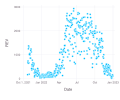

In [75]:
set_default_plot_size(12cm, 10cm)
plot(train, x=:Date, y=:REV)

#### 2.2 Nombre de passages sur le REV en fonction des conditions météorologiques

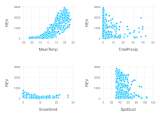

In [76]:
set_default_plot_size(16cm, 12cm)

fig1 = plot(train, x=:MeanTemp, y=:REV)
fig2 = plot(train, x=:TotalPrecip, y=:REV)
fig3 = plot(train, x=:SnowGrnd, y=:REV)
fig4 = plot(train, x=:SpdGust, y=:REV)

gridstack([fig1 fig2; fig3 fig4])

---
## 3. Ajustement d'un modèle de régression linéaire

Pour sélectionner les meilleurs modèles, on entraîne sur 80% des données d'entrainement et on teste sur les 20% restantes avec la métrique RMSLE
Puis pour Kaggle on entraîne sur tout l'ensemble

Traitement des valeurs manquantes : (à modifier) parce qu'elles plantent l'entraînement

In [89]:
### mini modèle pour prédire les missing bhays

# COL :

# MaxTemp
# MinTemp
# MeanTemp
# SnowGrnd
# SpdGust
data = deepcopy(train)

columns_missing = [:SnowGrnd, :SpdGust]
columns_complete = [:Date, :MaxTemp, :MinTemp, :MeanTemp, :TotalRain, :TotalSnow, :TotalPrecip, :SnowGrnd, :SpdGust]


filter!(row -> !ismissing(row[:MaxTemp]), data)

missing_idx_snow = findall(ismissing.(data[!, :SnowGrnd]))
non_missing_idx_snow = findall(.!(ismissing.(data[!, :SnowGrnd])))
missing_idx_gust = findall(ismissing.(data[!, :SpdGust]))
non_missing_idx_gust = findall(.!(ismissing.(data[!, :SpdGust])))

##Snow
data_snow = data[non_missing_idx_snow, :]
select!(data_snow, Not([:REV, :SpdGust]))
# display(data)
display(data_snow)

train_percentage = 0.8
train_size = Int(round(train_percentage * size(data_snow, 1)))

train_data = data_snow[1:train_size, 2:end]

# Création du jeu de données de test en excluant les lignes d'entraînement
test_data = data_snow[train_size+1:end, 2:end]

# Afficher la taille des ensembles d'entraînement et de test
println("Taille de l'ensemble d'entraînement : ", size(train_data))
println("Taille de l'ensemble de test : ", size(test_data))
first(train_data,5)


# formula = @formula(SnowGrnd ~ MaxTemp+ MinTemp+ MeanTemp+ TotalSnow)  

# # Ajuster le modèle GLM avec la loi de Poisson et la fonction de lien logit
# # Attention ici on utilise train_data et non train (juste les 80% premières données de test)
# model = glm(formula, train_data, Poisson(), LogLink())
function rmsle(y_true, y_pred)
    eps = 1e-10
    log_diff = log.(max.(y_pred, eps) .+ 1) .- log.(max.(y_true, eps) .+ 1)
    return sqrt(mean(log_diff .^ 2))
end

println("rmsle train",rmsle(predict(model, train_data), train_data.SnowGrnd))
println("rmsle test",rmsle(predict(model, test_data), test_data.SnowGrnd))
##SpdGust
# selected_rows = train[non_missing_idx_gust, :]



Row,Date,MaxTemp,MinTemp,MeanTemp,TotalRain,TotalSnow,TotalPrecip,SnowGrnd
,Date,Float64?,Float64?,Float64?,Float64,Float64,Float64,Int64?
1,2021-11-26,3.0,-1.7,0.7,5.2,3.6,15.4,0
2,2021-11-27,-1.7,-6.6,-4.2,0.0,0.0,0.0,2
3,2021-11-28,-2.6,-8.5,-5.6,0.0,0.0,0.0,2
4,2021-11-30,-1.3,-5.8,-3.6,0.0,0.2,0.2,2
5,2021-12-01,1.2,-4.7,-1.8,0.0,0.0,0.0,2
6,2021-12-02,6.6,-1.9,2.4,4.4,0.2,4.6,2
7,2021-12-04,-3.9,-9.9,-6.9,0.0,0.2,0.2,0
8,2021-12-05,-2.9,-9.3,-6.1,0.0,5.6,5.6,0
9,2021-12-06,8.7,-4.1,2.3,23.0,8.2,31.2,7


Taille de l'ensemble d'entraînement : (122, 7)
Taille de l'ensemble de test : (30, 7)


rmsle train0.8352688336184014
rmsle test1.1028213783616725


In [78]:
function coalesceWithPrevious!(df::DataFrame, columns::AbstractVector{<:Symbol})
    for column in columns
        col = df[!, column]

        if ismissing(col[1])
            col[1] = col[findfirst(.!(ismissing.(col)))]
        end

        ind = findall(ismissing.(col))

        for i in ind
            col[i] = col[i-1]
        end
    end

    return df
end


columns = [:Date, :MaxTemp, :MinTemp, :MeanTemp, :TotalRain, :TotalSnow, :TotalPrecip, :SnowGrnd, :SpdGust]

for col in columns
    if any(ismissing, train[!, col])
        println(col)
        # Extract non-missing values and their indices
        # mean_value = round(mean(skipmissing(train[!, col])))
        # missing_idx = findall(ismissing.(train[!, col]))
        # good_idx = findall(.!(ismissing.(train[!, col])))

        # for i in missing_idx
        #     train[!, col][i] = 0
        # end

        # for i in good_idx
        #     train[!, col][i] = 1
        # end
    end
end

display(train)

# Nombre de valeurs manquantes après le remplacement
for column in columns
    println("Nombre de valeurs manquantes après le remplacement ($column) : ", count(ismissing.(train[!, column])))
end
                    
#data = deepcopy(train)
#data[!,:REV] = log.(train.REV)

Row,Date,MaxTemp,MinTemp,MeanTemp,TotalRain,TotalSnow,TotalPrecip,SnowGrnd,SpdGust,REV
,Date,Float64?,Float64?,Float64?,Float64,Float64,Float64,Int64?,Int64?,Int64
1,2021-10-23,8.2,1.6,4.9,0.0,0.0,0.0,missing,missing,168
2,2021-10-24,11.9,2.5,7.2,0.0,0.0,0.0,missing,missing,694
3,2021-10-25,7.8,3.0,5.4,1.2,0.0,1.2,missing,43,746
4,2021-10-26,11.3,7.2,9.3,7.2,0.0,7.2,missing,53,646
5,2021-10-27,12.6,6.1,9.4,0.0,0.0,0.0,missing,59,1250
6,2021-10-28,10.8,3.4,7.1,0.0,0.0,0.0,missing,45,1373
7,2021-10-29,12.7,0.9,6.8,0.0,0.0,0.0,missing,36,1327
8,2021-10-30,12.7,2.5,7.6,12.8,0.0,12.8,missing,38,662
9,2021-10-31,11.1,7.8,9.5,38.0,0.0,38.0,missing,45,188


MaxTemp
MinTemp
MeanTemp
SnowGrnd
SpdGust


Nombre de valeurs manquantes après le remplacement (Date) : 0
Nombre de valeurs manquantes après le remplacement (MaxTemp) : 2
Nombre de valeurs manquantes après le remplacement (MinTemp) : 2
Nombre de valeurs manquantes après le remplacement (MeanTemp) : 2
Nombre de valeurs manquantes après le remplacement (TotalRain) : 0
Nombre de valeurs manquantes après le remplacement (TotalSnow) : 0
Nombre de valeurs manquantes après le remplacement (TotalPrecip) : 0
Nombre de valeurs manquantes après le remplacement (SnowGrnd) : 282
Nombre de valeurs manquantes après le remplacement (SpdGust) : 105


In [79]:
train_percentage = 0.8
train_size = Int(round(train_percentage * size(train, 1)))

train_data = train[1:train_size, 2:end]

# Création du jeu de données de test en excluant les lignes d'entraînement
test_data = train[train_size+1:end, 2:end]

# Afficher la taille des ensembles d'entraînement et de test
println("Taille de l'ensemble d'entraînement : ", size(train_data))
println("Taille de l'ensemble de test : ", size(test_data))
first(train_data,5)

Taille de l'ensemble d'entraînement : (348, 9)
Taille de l'ensemble de test : 

(87, 9)


Row,MaxTemp,MinTemp,MeanTemp,TotalRain,TotalSnow,TotalPrecip,SnowGrnd,SpdGust,REV
,Float64?,Float64?,Float64?,Float64,Float64,Float64,Int64?,Int64?,Int64
1,8.2,1.6,4.9,0.0,0.0,0.0,missing,missing,168
2,11.9,2.5,7.2,0.0,0.0,0.0,missing,missing,694
3,7.8,3.0,5.4,1.2,0.0,1.2,missing,43,746
4,11.3,7.2,9.3,7.2,0.0,7.2,missing,53,646
5,12.6,6.1,9.4,0.0,0.0,0.0,missing,59,1250


1er Modèle contenant toutes les variables explicatives (sauf la date, à traiter plus tard) : GLM avec la loi de poisson, puique les variables explicatives sont des variables de comptage

In [80]:
formula = @formula(REV ~ MaxTemp+ MinTemp+ MeanTemp+ TotalRain+ TotalSnow+ TotalPrecip+ SnowGrnd+ SpdGust)  

# Ajuster le modèle GLM avec la loi de Poisson et la fonction de lien logit
# Attention ici on utilise train_data et non train (juste les 80% premières données de test)
model = glm(formula, train_data, Poisson(), LogLink())

StatsModels.TableRegressionModel{GeneralizedLinearModel{GLM.GlmResp{Vector{Float64}, Poisson{Float64}, LogLink}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

REV ~ 1 + MaxTemp + MinTemp + MeanTemp + TotalRain + TotalSnow + TotalPrecip + SnowGrnd + SpdGust

Coefficients:
────────────────────────────────────────────────────────────────────────────────
                   Coef.  Std. Error       z  Pr(>|z|)    Lower 95%    Upper 95%
────────────────────────────────────────────────────────────────────────────────
(Intercept)   6.14289     0.0320036   191.94    <1e-99   6.08017      6.20562
MaxTemp       0.405025    0.129148      3.14    0.0017   0.151901     0.65815
MinTemp       0.396731    0.129384      3.07    0.0022   0.143144     0.650319
MeanTemp     -0.741814    0.257778     -2.88    0.0040  -1.24705     -0.236578
TotalRain    -0.0175093   0.00952284   -1.84    0.0660  -0.0361737    0.00115513
TotalSnow    -0.0

Métrique de performance :

In [81]:
function rmsle(y_true, y_pred)
    eps = 1e-10
    log_diff = log.(max.(y_pred, eps) .+ 1) .- log.(max.(y_true, eps) .+ 1)
    return sqrt(mean(log_diff .^ 2))
end

println("rmsle train",rmsle(predict(model, train_data), train_data.REV))
println("rmsle test",rmsle(predict(model, test_data), test_data.REV))

rmsle trainmissing
rmsle testmissing


---
## 4. Estimation du nombre de passages de l'ensemble de test

On utilise le modèle simple de la section précédente pour le nombre de passages pour chacun des jours de l'ensemble de test.

#### 4.1 Chargement des données de l'ensemble de test

In [82]:
test = CSV.read("test.csv", DataFrame)
first(test, 5)

ArgumentError: ArgumentError: "test.csv" is not a valid file or doesn't exist

#### 4.2 Traitement des valeurs manquantes

Dans l'ensemble de test, il y a des jours pour lesquelles la température moyenne (la variable explicative utilisée dans le modèle simple) est manquante. 

Ici, je propose de remplacer les valeurs manquantes par la température moyenne du jour précédent. C'est une façon simple et même peut-être simpliste de traiter les valeurs manquantes. Ce sera à vous de décider comment les traiter.

In [83]:
function coalesceWithPrevious!(df::DataFrame, columns::AbstractVector{<:Symbol})
    for column in columns
        col = df[!, column]

        if ismissing(col[1])
            col[1] = col[findfirst(.!(ismissing.(col)))]
        end

        ind = findall(ismissing.(col))

        for i in ind
            col[i] = col[i-1]
        end
    end

    return df
end

columns = [:Date,:MaxTemp,:MinTemp,:MeanTemp,:TotalRain,:TotalSnow,:TotalPrecip,:SnowGrnd,:SpdGust]
coalesceWithPrevious!(test, columns)

# Nombre de valeurs manquantes après le remplacement
for column in columns
    println("Nombre de valeurs manquantes après le remplacement ($column) : ", count(ismissing.(test[!, column])))
end

UndefVarError: UndefVarError: `test` not defined

#### 4.3 Prédictions

On retransforme les prédictions dans l'espace logarithmique pour obtenir des nombres de passages.

In [84]:
#On entraîne d'abord sur tout l'ensemble
model = glm(formula, train, Poisson(), LogLink())
predictions = predict(model, test)

# Vous pouvez transformer vos prédictions en valeurs entières si vous le souhaitez. Mais ce n'est pas nécessaire.
# predictions = Int.(round.(predictions, digits=0))

UndefVarError: UndefVarError: `test` not defined

#### 4.4 Préparation du fichier des préditions pour téléverser sur Kaggle

Le fichier *benchmark_predictions.csv* généré peut être téléversé sur Kaggle. Il est composé d'une colonne d'identifiants (:ID) et d'une colonne de la prédiction (:REV).

In [85]:
fichier = DataFrame(ID = test.ID, REV=predictions)
first(fichier, 5)

UndefVarError: UndefVarError: `test` not defined

In [86]:
CSV.write("predictions.csv", fichier)

UndefVarError: UndefVarError: `fichier` not defined